# What are people talking about when they talk about the COVID-19 vaccine?

## Introduction
News of a COVID vaccine release, or a lack thereof, has been out for a few months now. With that comes various opinions about the vaccine, and many choose to be vocal about their ideas on social media. We wondered whether looking at social media would help us understand what different communities across the world thought of the Vaccine, and whether such opinions are teetered by their socio-political climates and geographical locations.

To do this, we turned to Twitter and scraped tweets containing hastags related to the vaccine. We then took these datapoints and quantified their approval ratings by calcuatinng sentiment score for each text. We then expressed this information in the form of graphs and maps. Currently, we have 5000 datapoints, and over 2000 datapoints with geographical coordinates.

We hope that by reviewing these charts and maps, we can better understand the concerns different communitites have over the vaccine, and what may be contributing factors to this.

## Data Sources & Description
The datasets we will be using are the Pfizer and BioNTech Vaccine Tweets Dataset and the Covid-19 Global Dataset. 
The Pfizer and BioNTech Vaccine Tweets Dataset is posted on Kaggle and created by Gabriel Preda, who is a data scientist in Romania. The dataset includes variables such as users’ names, locations, and their original tweets about the vaccines. The link to the datasets is:
  * https://www.kaggle.com/gpreda/pfizer-vaccine-tweets

The Covid-19 Global Dataset contains the up-to-date numbers of daily confirmed, death and active cases for 218 countries. The creator of the data set is an artificial intelligence engineer from Lebanon. The link to the datasets is:
  * https://www.kaggle.com/josephassaker/covid19-global-dataset?select=worldometer_coronavirus_summary_data.csv

## Fundamental Bias
Our dataset was filled with users locations that were not real locations on earth. To filter these out, we used libraries that could detect legitimate city names and country codes. Since this library only recognizes english words however, many non english speaking countries may have been cut out from out dataset. Our dataset therefore leans towards english speaking citites, and our research analysis may be centered around the US and Europe.

## Importing Data
Since the Tweets Dataset we will be using is updated daily, besides saving a copy of the older version, we also want to import the most up to date data directly from Kaggle using the provided API. Here are the steps:
* Go to your account, Scroll to API section and Click Expire API Token to remove previous tokens.
* Click on Create New API Token - It will download kaggle.json file on your machine.
* now just put it in the location C:\Users\(your user name)\.kaggle.

In [1]:
# uncomment next line if Kaggle library is not installed on your computer
#!pip install kaggle
from kaggle.api.kaggle_api_extended import KaggleApi
from zipfile import ZipFile
api = KaggleApi()
api.authenticate()
# download a copy of the most up to date data to your computer
api.dataset_download_files('gpreda/pfizer-vaccine-tweets')
# unzip the download file
zf = ZipFile('pfizer-vaccine-tweets.zip')
#extracted data is saved in the same directory as notebook
zf.extractall() 
zf.close()

## Access the data we just downloaded

In [2]:
import pandas as pd
df_tweets=pd.read_csv('vaccination_tweets.csv')

### Some Basic Checkings
* Number of rows and column variables.
* The name of the column variabes.
* A quick glance of the actual data using the head method.

In [3]:
print(df_tweets.shape)
print(df_tweets.columns)
df_tweets.head(3)

(6932, 16)
Index(['id', 'user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'retweets', 'favorites',
       'is_retweet'],
      dtype='object')


,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False


Since we are interested in the geographical reaationship of the users and want to analyze the tweets' content, some cleaning and engineering needs to be done.

## Data Engineering

### Data Engineering - Change the date format

In [4]:
# change the date format
df_tweets['date'] = pd.to_datetime(df_tweets['date'], errors = 'coerce')
df_tweets['user_created'] = pd.to_datetime(df_tweets['user_created'], errors = 'coerce')

### Data Engineering - Users' Location
User locations like 'Your Bed' and NaN clearly won't help with our geographical analysis.
We want to at least extract the city and country from the location description/ 'user_locatiom' column. 

To accomplish this task, we will us a library called **Geotext**.This library allows us to extract **city name** and **country code** without going through the NLP hassle. The geological information will be used for the data exploration process and guide our direction of this research.

Import GeoText and the OrderedDict library, we will use the OrderedDict library to interact with the results returned from GeoText.

In [5]:
# uncomment next line to intall Geotext if you have not yet installed
#!pip install geotext
from geotext import GeoText
# we will need the another tool to interact with Geotext
from collections import OrderedDict 

### How GeoText works?

In [6]:
places1 = GeoText("my bed")
print(places1.cities)
places2 = GeoText("London is a great city")
print(places2.cities)
print(places2.country_mentions.keys())
print(list(places2.country_mentions.keys())[0])

[]
['London']
odict_keys(['GB'])
GB


Notice that not all users' location description are useable since GeoText can only read strings. Therefore we want to do some subsetting.

It's okay to have empty string as location description, Geotext will figure it out.

In [7]:
# convert the column to string
df_tweets['user_location'] = df_tweets['user_location'].astype('string')

Finally, extracting location data. 

Here we use a try block to skip cases with emojis and random characters.

In [8]:
user_city = []
user_country = []
for index, row in df_tweets.iterrows():
    try:
        if GeoText(row['user_name']+' '+row['user_location']).cities:
            user_city.append(GeoText(row['user_name']+' '+row['user_location']).cities[0])
            user_country.append(list(GeoText(row['user_name']+' '+row['user_location']).country_mentions.keys())[0])
        else:
            user_city.append('')
            user_country.append('')
    except:
        user_city.append('')
        user_country.append('')      
# Assign it as new columns
df_tweets['user_city'] = user_city
df_tweets['user_country'] = user_country

### Data Engineering - Geocoding Users' Location
The city names and coutry code is usefull for statistical purposes.But they are not helpful interms of mapping. Therefore we need to geocode (get the longitude and latitude) the cities by their name. To do this, we will use the help of Geopy.

In [9]:
# uncomment next line to intall GeoPy if you have not yet do so
#!pip install geopy
import geopy
from geopy.geocoders import Nominatim
locator = Nominatim(user_agent="myGeocoder")

How it works:

In [10]:
print(locator.geocode("Los Angeles"))
print(locator.geocode("Los Angeles").latitude)
print(locator.geocode("Los Angeles").longitude)

Los Angeles, Los Angeles County, California, United States
34.0536909
-118.242766


Keep in mind that an IP address will have a limited amount of access to the server. Also, you can make one request per second. Make sure to skip the empty strings to save your resources and time.

In [11]:
%%time
lat = []
lon = []
for index, row in df_tweets.iterrows():
    if row['user_city']:
        lat.append(locator.geocode(row['user_city']).latitude)
        lon.append(locator.geocode(row['user_city']).longitude)
    else:
        lat.append('')
        lon.append('')
df_tweets['lat']=lat
df_tweets['lon']=lon

Wall time: 39min 1s


In [12]:
df_tweets[['user_location','user_city','lat','lon']].head(5)

,user_location,user_city,lat,lon
0,"La Crescenta-Montrose, CA",Montrose,38.437539,-108.240386
1,"San Francisco, CA",San Francisco,37.779026,-122.419906
2,Your Bed,,,
3,"Vancouver, BC - Canada",Vancouver,49.260872,-123.113953
4,<NA>,,,


### Data Engineering - Text Sentiment Analysis & Pre-Natural Language Processing
Besides the spacial relationship, we are also interested in the content that users posted. To measure users' approval of the COVID-19 vaccine, we will approach with the sentiment score of the texts.

The nltk library we will be using returns measures of postivity, negativity, neutrality, and a compound sentiment score of the text. The higher the compound sentiment score, the greater the approval.

We will need to import the NLTK library and download some dictionaries to run certain methods.

In [13]:
import nltk
# downlaod some resouces
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.sentiment import SentimentIntensityAnalyzer

# load the sentiment function
sia = SentimentIntensityAnalyzer()
# load the stemmer function 
porter = nltk.PorterStemmer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Wuyue\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Wuyue\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Wuyue\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


We should always clen the text first! We will also store the words list in each tweet for future content analysis and visualizations.

In [14]:
# clean the text

# removing everything except alphabets`
df_tweets['clean_text'] = df_tweets['text'].str.replace("[^a-zA-Z#]", " ")

# removing short words
df_tweets['clean_text'] = df_tweets['clean_text'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

# make all text lowercase
df_tweets['clean_text'] = df_tweets['clean_text'].apply(lambda x: x.lower())

# romve stop-wards
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

# tokenization
tokenized_tweet = df_tweets['clean_text'].apply(lambda x: x.split())

# remove stop-words
tokenized_tweet = tokenized_tweet.apply(lambda x: [item for item in x if item not in stop_words])

# similar to stop words, we create a list of words we don't want
unwanted_words = ['covid','vaccine']
tokenized_tweet = tokenized_tweet.apply(lambda x: [w for w in x if w not in unwanted_words])
tokenized_tweet = tokenized_tweet.apply(lambda x: [w for w in x if not(w.find('http')!=-1)])
tokenized_tweet = tokenized_tweet.apply(lambda x: [w for w in x if not(w.find('vac')!=-1)])
tokenized_tweet = tokenized_tweet.apply(lambda x: [w for w in x if not(w.find('covid')!=-1)])

# de-tokenization
detokenized_tweet = []
for i in range(len(df_tweets)):
    t = ' '.join(tokenized_tweet[i])
    detokenized_tweet.append(t)
df_tweets['tweet_words'] = tokenized_tweet 
df_tweets['clean_text'] = detokenized_tweet

<ipython-input-14-8c7f1409511a>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  df_tweets['clean_text'] = df_tweets['text'].str.replace("[^a-zA-Z#]", " ")


We also want to **amplify a user's noise on the internet** by taking the retweet number into consideration.So the tweets stands out in the statistics.

In [15]:
# tweet context 
df_tweets['amplified_text'] = df_tweets['clean_text'] * (df_tweets['retweets']+1)

In [16]:
df_tweets[['tweet_words','text','clean_text','amplified_text']].head(3)

,tweet_words,text,clean_text,amplified_text
0,"[folks, said, daikon, paste, could, treat, cyt...",Same folks said daikon paste could treat a cyt...,folks said daikon paste could treat cytokine s...,folks said daikon paste could treat cytokine s...
1,"[world, wrong, side, history, year, hopefully,...",While the world has been on the wrong side of ...,world wrong side history year hopefully bigges...,world wrong side history year hopefully bigges...
2,"[#coronavirus, #sputnikv, #astrazeneca, #pfize...",#coronavirus #SputnikV #AstraZeneca #PfizerBio...,#coronavirus #sputnikv #astrazeneca #pfizerbio...,#coronavirus #sputnikv #astrazeneca #pfizerbio...


Now we can perform sentiment analysis, here is a demo of how it works:

In [17]:
sia.polarity_scores('Why did the scarecrow win an award? Because he was outstanding in his field!')

{'neg': 0.077, 'neu': 0.427, 'pos': 0.496, 'compound': 0.8955}

Now we will calculate the sentiment score for each tweet.

In [18]:
# create new list for adding new columns
neg_sentiment = []
pos_sentiment = []
neu_sentiment = []
compound_sentiment = []

# iterate through all rows and calcukate sentiment scores
for index, row in df_tweets.iterrows():
    tweet = row['amplified_text'] 
    # the sentiment score is calculated by one line of code
    # it returns a disctionary, so we need to name the score we want
    neg_sentiment.append(sia.polarity_scores(tweet)['neg'])
    pos_sentiment.append(sia.polarity_scores(tweet)['pos'])
    neu_sentiment.append(sia.polarity_scores(tweet)['neu'])
    compound_sentiment.append(sia.polarity_scores(tweet)['compound'])

df_tweets['neg_sentiment'] = neg_sentiment
df_tweets['pos_sentiment'] = pos_sentiment
df_tweets['neu_sentiment'] = neu_sentiment
df_tweets['compound_sentiment'] = compound_sentiment

Now we categorize the tweets based on their compound sentiment score.

In [19]:
import numpy as np
# create a list of our conditions
conditions = [
    (df_tweets['compound_sentiment'] < -0.25), #negative
    (df_tweets['compound_sentiment'] > -0.25) & (df_tweets['compound_sentiment'] <= 0.25),    # neutral
    (df_tweets['compound_sentiment'] > 0.25)  #positive
    ]

# create a list of the values we want to assign for each condition
values = [
    'negative', 
    'neutral', 
    'positive',
    ]

# create a new column and use np.select to assign values to it using our lists as arguments
df_tweets['sentiment'] = np.select(conditions, values)

Let's do some simple checking...
The following cell will demonstrate how we processed a single tweet.

In [259]:
print (df_tweets['text'][5])
print (df_tweets['tweet_words'][5])
print (df_tweets['neg_sentiment'][5])
print (df_tweets['pos_sentiment'][5])
print (df_tweets['neu_sentiment'][5])
print (df_tweets['compound_sentiment'][5])
print (df_tweets['sentiment'][5])

Does anyone have any useful advice/guidance for whether the COVID vaccine is safe whilst breastfeeding?… https://t.co/EifsyQoeKN
['anyone', 'useful', 'advice', 'guidance', 'whether', 'safe', 'whilst', 'breastfeeding', 'eifsyqoekn']
0.0
0.453
0.547
0.7003
positive


## Data Exploration and Analysis
The data cleaning and enginerring took about 80% of the time spent on this project so far. Now we can finaly start our analysis.

### What roles do social medias play in the spread of COVID-19 related information?
One of the first questions that we were most interested in, is whether there an influx of users since the spread of COVID 19. In the graph below, we create a histogram of new twitter users per year.

Text(0, 0.5, 'New Users Created')

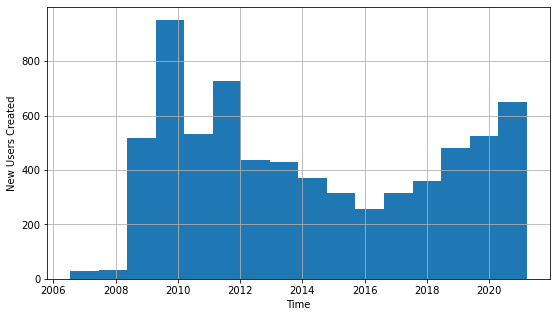

In [20]:
import datetime
import matplotlib as plt
df_tweets['user_created']=pd.to_datetime(df_tweets['user_created'])
ax = df_tweets["user_created"].hist(bins=16,figsize=(9,5))
#ax.set_xlim([datetime.date(2017, 1, 1), datetime.date(2021, 2, 10)])
#ax.set_ylim([0, 700])
ax.set_xlabel("Time")
ax.set_ylabel("New Users Created")

It seems like there is an increase in user creation after 2020. This is promising because in 2019, the number of users starts decreasing, and it looks like Twitter was starting to lose popularity like in 2012. This implies that COVID and quarantine may have prompted an increase in users.

To confirm our suspicion, though, lets zoom into the graph even further. 

Text(0, 0.5, 'New Users Created')

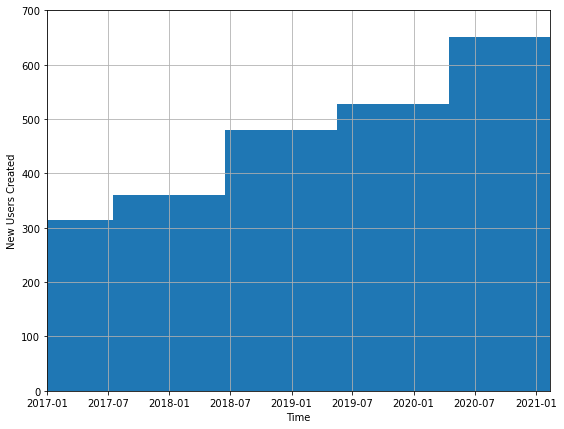

In [21]:
ax = df_tweets["user_created"].hist(bins=16,figsize=(9,7))
ax.set_xlim([datetime.date(2017, 1, 1), datetime.date(2021, 2, 10)])
ax.set_ylim([0, 700])
ax.set_xlabel("Time")
ax.set_ylabel("New Users Created")

**Analysis**

There is an increase in new user number right after the COVID-19 outbreak, so we can assume they are related. This shows people use online social media platforms to obtain news and information, as well as express their opinions.

### What cities generated the most discussions about the COVID vaccines?
Now that we know this year's Twitter has been a hot spot for COVID news, let's first check different cities to see where we are getting the most tweets.

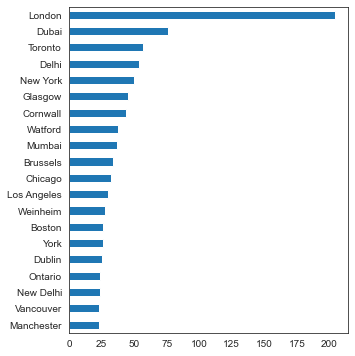

In [262]:
df_cities = df_tweets.query("user_city != ''")
ax = df_cities['user_city'].value_counts(sort=False).nlargest(20).plot(kind='barh',figsize=(5,6))
ax.invert_yaxis()

**To verify the diverity of our data**, we want to see some users are tweeting more frequently than others.

In [263]:
frequent_tweeters = df_tweets['user_name'].value_counts().head(30).to_frame().reset_index()
frequent_tweeters.columns = ['user_name', 'count']
frequent_tweeters.head(30)

,user_name,count
0,New Straits Times,65
1,TheRag,49
2,🕷Financial Bear 3.5%,45
3,Ian 3.5% #FBPE,37
4,Whtrslugcaviiersong#dontstayhomeandcatchcovid19,30
5,Simon Hodes ⬅️2m➡️ 😷,30
6,Medical Study Blog,29
7,Dr.Krutika Kuppalli,29
8,ILKHA,29
9,CHEManager International,28


Where are they tweeting from?

In [264]:
cities = []
countries = []
for index, row in df_tweets.iterrows():
    if row['user_name'] in list(frequent_tweeters['user_name']):
        if row['user_city'] and row['user_country']:
            cities.append(row['user_city'])
            countries.append(row['user_country'])
pairs = {'city': cities , 'country': countries}
df = pd.DataFrame(pairs)
df.groupby('country')['city'].value_counts()

country  city    
AE       Dubai       16
CA       Cornwall    37
DE       Weinheim    28
GB       Watford     30
         Glasgow     20
         Poole       14
IN       Mumbai      17
         Delhi       15
Name: city, dtype: int64

This doesn't affect the diversity of data too much, we can live with it.

What about the countries?

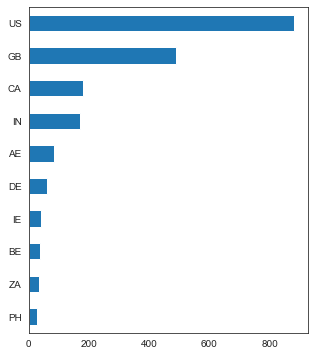

In [265]:
df_countries = df_tweets.query("user_country != ''")
ax = df_countries['user_country'].value_counts(sort=False).nlargest(10).plot(kind='barh',figsize=(5,6))
ax.invert_yaxis()

Notice that the United States has the most users number in the dataset, we want to take a look at what U.S cities have tweeted the most about the vaccine. We also want to see what makes them stand out and possible reasons behind this.

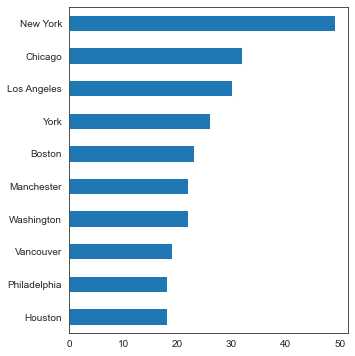

In [266]:
df_UStweets = df_tweets.query("user_country == 'US'")
ax = df_UStweets['user_city'].value_counts(sort=False).nlargest(10).plot(kind='barh',figsize=(5,6))
ax.invert_yaxis()

### Analysis
We can see that our data is skewed towards American, British, and Indian users the most. Therefore, it would make sense to compare these three countries through further analysis of their most tweeted cities. In doing so, we can get a better idea of their sentiment scores, and draw more intuitive conclusions as to why their approval ratings are the way that they are.

### Sentiment Measure vs. Location
With location data and sentiment score, we can quantify the public approval of vaccines for different cities and countries.

We first take a look at the global response for all posts.

0.15233907963069848


Text(0.5, 0, 'Compound Sentiment')

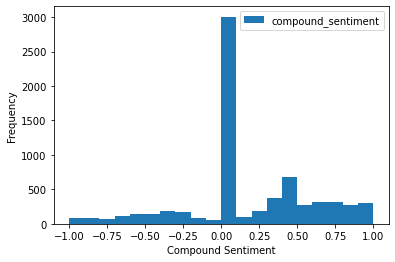

In [22]:
ax = df_tweets['compound_sentiment'].plot.hist(stacked=True,bins=20)
print(df_tweets['compound_sentiment'].mean())
ax.legend()
ax.set_xlabel("Compound Sentiment")

We can see most posts are neutral, and there are more 'positive' posts than 'negative' ones, which yields a positive average sentiment score. This is a good sign for puplic's acceptance of the vaccine.

Now let's take a look at the scores of different countries.

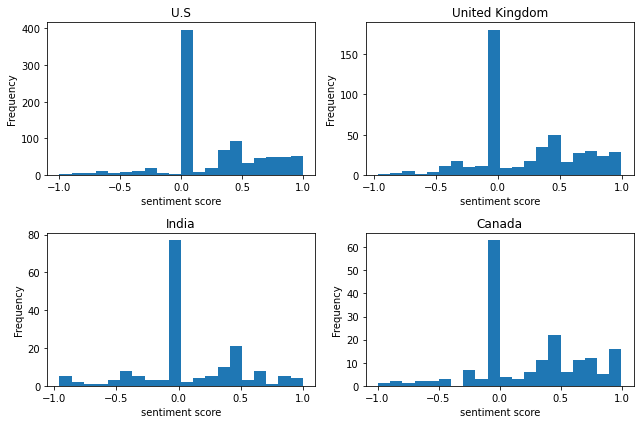

In [23]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(9,6))

# Divide the figure into a 1x2 grid, and give me the first section
# ax1 = fig.add_subplot(2, 2, (1,2))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4)
axs = [ax1,ax2,ax3,ax4]
contries = ['US','GB','IN','CA']
contries_full = ["U.S","United Kingdom","India","Canada"]

for i in range(len(axs)):
    df_tweets.query("user_country == '"+ contries[i] + "'" )['compound_sentiment'].plot.hist(stacked=True,bins=20, ax=axs[i])
    axs[i].set(xlabel='sentiment score', ylabel='Frequency', title=contries_full[i] )

plt.tight_layout()
plt.show()

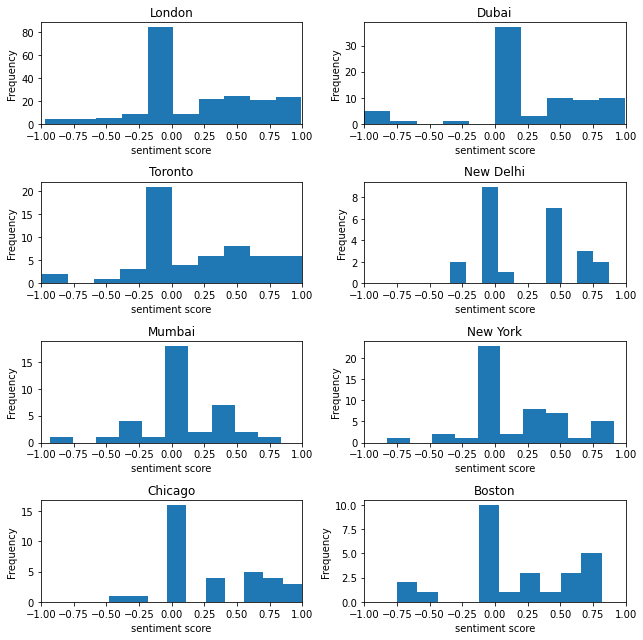

In [24]:
fig = plt.figure(figsize=(9,9))
# Divide the figure into a 4x2 grid, the first section is ax1 = fig.add_subplot(2, 2, (1,2))
axs = []
for i in range(1,9):
    axs.append(fig.add_subplot(4, 2, i))
cities = ['London','Dubai','Toronto','New Delhi','Mumbai','New York','Chicago','Boston']

for i in range(len(axs)):
    df_tweets.query("user_city == '"+ cities[i] + "'" )['compound_sentiment'].plot.hist(stacked=True,bins=10, ax=axs[i])
    axs[i].set(xlabel='sentiment score', ylabel='Frequency', title=cities[i] )
    axs[i].set_xlim(-1,1)

plt.tight_layout()
plt.show()

### Analysis
We can see that India cities Mumbai and New Dehli have a particularly larger number of low sentiment scores. This leades us to believe that there may be some socio-political reason that is influencing public opinion about the COVID vaccine.

Upon searching on the internet, a recent BBC aritcle titled "India Covid-19: Misleading claims shared about vaccines" stated that rumors such as Covid Vaccines containing pork, or microchips have been circulated within the media. Although top health professionals such as Health Minister Dr Harsh Vardhan has refuted such claims, they may be contributing to skewing of sentiment scores.

More research will need to be done regarding this topic, and we will also need to look into positively skewed cities such as New York.

## Topic Modeling
We want to know the topics of convsersations around the covid vaccine. We will perform this using the singular value decomposition and extract the keywords of top 5 topics.The topics will also be visualized in word clouds.

### Let's make some tools first.

In [25]:
# import tools
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

def getTopics(df, topicsNum):
    vectorizer = TfidfVectorizer(stop_words='english', 
                                 max_features= 1000, # keep top 1000 terms 
                                 max_df = 0.5, 
                                 smooth_idf=True)
    X = vectorizer.fit_transform(df['amplified_text'])
    #X.shape # check shape of the document-term matrix
    # SVD represent documents and terms in vectors 
    svd_model = TruncatedSVD(n_components=topicsNum, algorithm='randomized', n_iter=100, random_state=122)
    svd_model.fit(X)
    
    terms = vectorizer.get_feature_names()

    for i, comp in enumerate(svd_model.components_):
        terms_comp = zip(terms, comp)
        sorted_terms = sorted(terms_comp, key= lambda x:x[1], reverse=True)[:7]
        string = "Topic "+str(i+1)+": "
        for t in sorted_terms:
            string = string + t[0] + ' '
        print(string)

In [26]:
# show topic clusters
#!pip uninstall umap
#!pip install umap-learn
import umap
def showCluster(df, topicsNum):
    svd_model = TruncatedSVD(n_components=topicsNum, algorithm='randomized', n_iter=100, random_state=122)
    X = vectorizer.fit_transform(df['amplified_text'])
    X_topics = svd_model.fit_transform(X)
    embedding = umap.UMAP(n_neighbors=150, min_dist=0.5, random_state=12).fit_transform(X_topics)
    plt.figure(figsize=(7,5))
    plt.scatter(embedding[:, 0], embedding[:, 1], 
                #c = dataset.target,
                s = 10, # size
                edgecolor='none'
               )
    plt.show()

In [27]:
# for making word clouds
from textblob import TextBlob
import re


from wordcloud import WordCloud, STOPWORDS

def showWordCloud(df):
    # now put every word from every tweet into a single variable
    all_text = ' '.join(df['amplified_text'])
    # create the word cloud
    wordcloud = WordCloud(width=1200, 
                      height=800,
                      background_color="white").generate(all_text)

    # Display the WordCloud                    
    plt.figure(figsize=(12,12))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

### Global topic analysis and word cloud visualization.

Positive topics
Topic 1: dose pfizer today thank grateful received second 
Topic 2: pfizer biontech coronavirus approved effective emegency view 
Topic 3: thank nhs pfizer science scientists team nhsuk 
Topic 4: today grateful thanks good received pfizer feeling 
Topic 5: thanks pfizer effective safe shot study nhs 


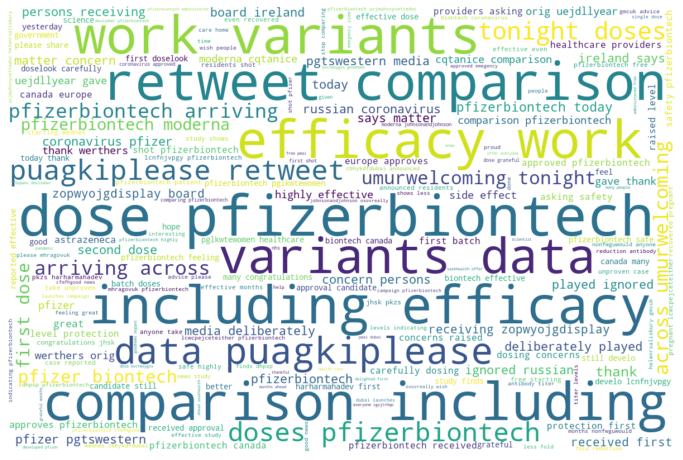


Neutral topics
Topic 1: dose pfizer second today biontech received coronavirus 
Topic 2: pfizer biontech moderna coronavirus doses astrazeneca million 
Topic 3: today shot received second doses coronavirus getting 
Topic 4: moderna astrazeneca doses coronavirus mrna received people 
Topic 5: doses coronavirus second million people received biontech 


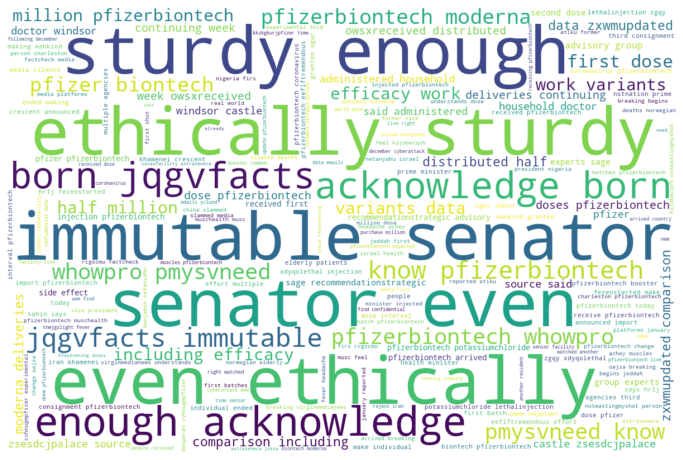


Negative topics
Topic 1: pfizerbiontech pfizer dose people coronavirus biontech emergency 
Topic 2: pfizer biontech emergency norway korea died people 
Topic 3: coronavirus death toll iran khamenei crescent exceeds 
Topic 4: people norway died receiving allergic getting elderly 
Topic 5: dose sore hours effects second post injection 


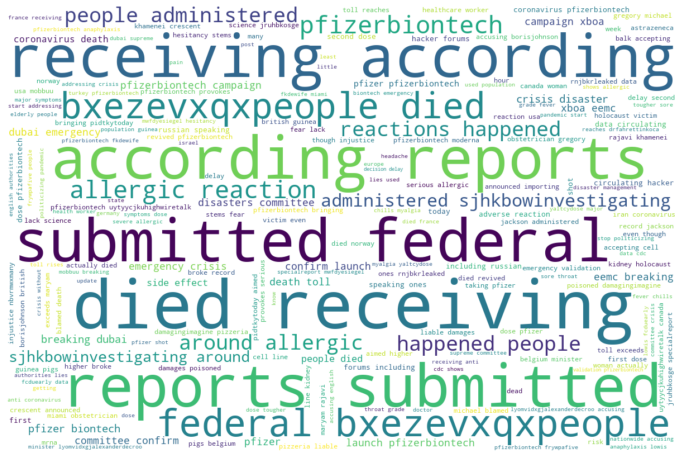

In [28]:
print('Positive topics')
getTopics(df_tweets.query("compound_sentiment>0.25"), topicsNum=5)
showWordCloud(df_tweets.query("compound_sentiment>0.25"))
print('\nNeutral topics')
getTopics(df_tweets.query("compound_sentiment<0.25 & compound_sentiment>-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("compound_sentiment<0.25 & compound_sentiment>-0.25"))
print('\nNegative topics')
getTopics(df_tweets.query("compound_sentiment<-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("compound_sentiment<-0.25"))

### US topic analysis and word cloud visualization.

Positive topics
Topic 1: dose today thank pfizer received grateful second 
Topic 2: thank scientists today science getting healthcare esneft 
Topic 3: today received shot good proud feel qothjtfusp 
Topic 4: pfizer effective biontech news variants joebiden study 
Topic 5: feeling shot good great hours second hourcheck 


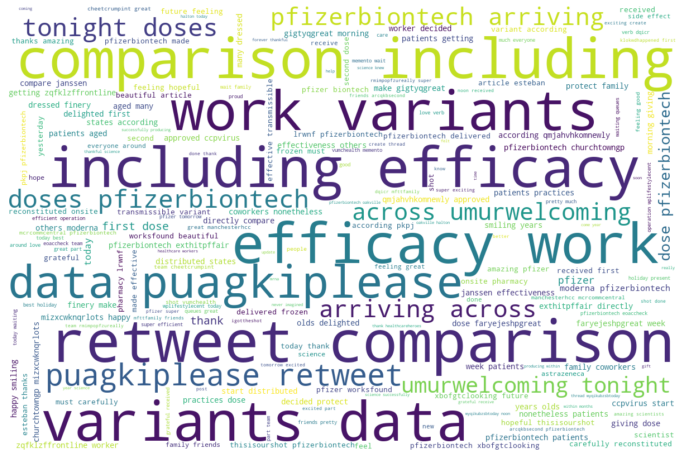


Neutral topics
Topic 1: dose second pfizer today received shot yesterday 
Topic 2: pfizer today moderna biontech shot getting youtube 
Topic 3: today shot second received finally booster wecanbeatthis 
Topic 4: moderna received doses astrazeneca people million johnson 
Topic 5: second shot pfizer tell uxkmd gates vchdrdwmgg 


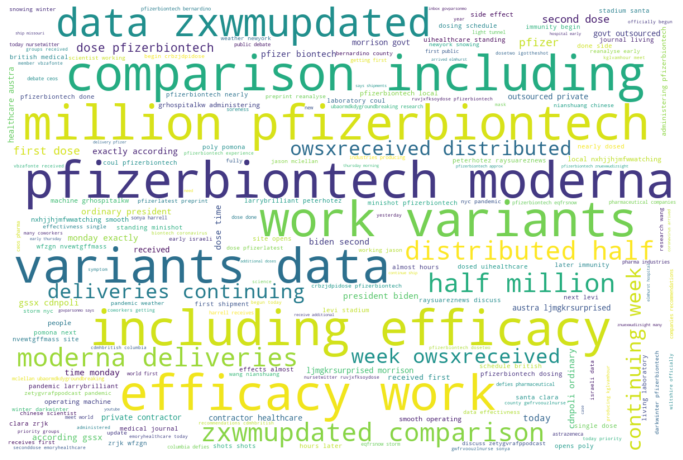


Negative topics
Topic 1: sore pfizerbiontech dose hours effects second little 
Topic 2: effects sore second hours cqri time different 
Topic 3: shot pfizerbiontech little hurts hourcheck lift mildarmsoreness 
Topic 4: people died receiving administered effects allergic deaths 
Topic 5: shot headache feel hurts symptoms fever chills 


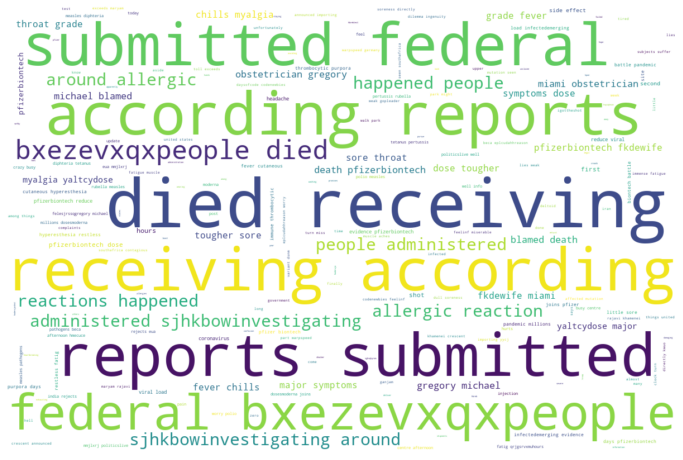

In [29]:
print('Positive topics')
getTopics(df_tweets.query("user_country == 'US' & compound_sentiment>0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'US' & compound_sentiment>0.25"))
print('\nNeutral topics')
getTopics(df_tweets.query("user_country == 'US' & compound_sentiment<0.25 & compound_sentiment>-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'US' & compound_sentiment<0.25 & compound_sentiment>-0.25"))
print('\nNegative topics')
getTopics(df_tweets.query("user_country == 'US' & compound_sentiment<-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'US' & compound_sentiment<-0.25"))

### India topic analysis and word cloud visualization.

Positive topics
Topic 1: pfizer effective pfizerbiontech variant biontech coronavirusstrain study 
Topic 2: india lead surely thing witness world drharshvardhan 
Topic 3: approved said saturday administration aviation federal unitedstates 
Topic 4: variant effective astrazeneca formulas manufacturers said finds 
Topic 5: said carry efficiently engineered mutations neutralized version 


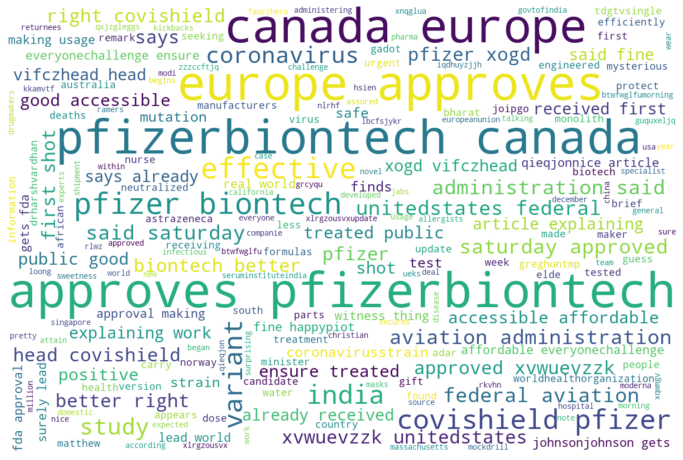


Neutral topics
Topic 1: pfizerbiontech pfizer moderna astrazeneca biontech dose received 
Topic 2: moderna covaxin astrazeneca pfizerbiontech compare infographic matched 
Topic 3: norway deaths china silence media elderly patients 
Topic 4: astrazeneca pharmaceutical alexion billion firm pfizer gqivpgw 
Topic 5: variants africa south work study says pfizerbiontech 


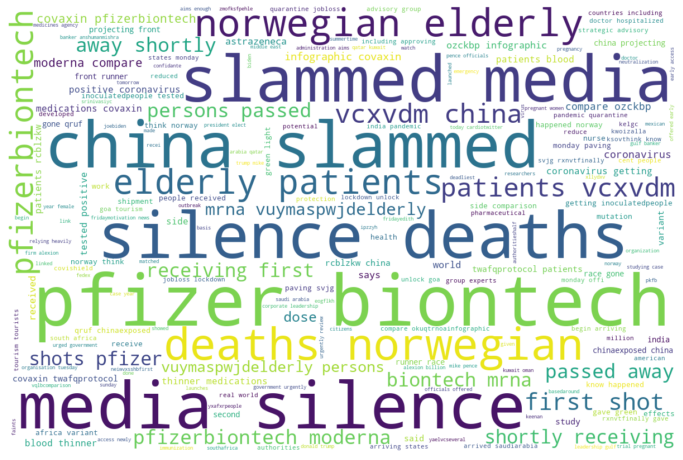


Negative topics
Topic 1: emergency coronavirus india norway biontech people allowed 
Topic 2: norway people receiving died elderly dead experts 
Topic 3: allergic canada health ingredients warned nrxgnpaq skldv 
Topic 4: biontech coronavirus clears uwljeyuijy hzic issues validation 
Topic 5: coronavirus kqnb little worrisome allowed canada sfndmev 


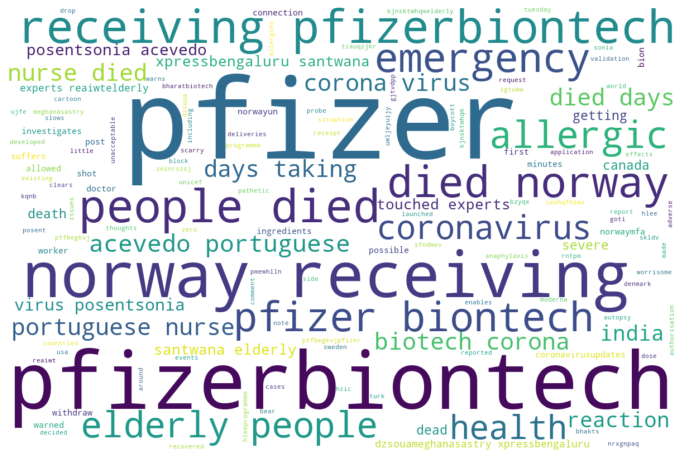

In [30]:
print('Positive topics')
getTopics(df_tweets.query("user_country == 'IN' & compound_sentiment>0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'IN' & compound_sentiment>0.25"))
print('\nNeutral topics')
getTopics(df_tweets.query("user_country == 'IN' & compound_sentiment<0.25 & compound_sentiment>-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'IN' & compound_sentiment<0.25 & compound_sentiment>-0.25"))
print('\nNegative topics')
getTopics(df_tweets.query("user_country == 'IN' & compound_sentiment<-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'IN' & compound_sentiment<-0.25"))

### United Kingdom topic analysis and word cloud visualization.

Positive topics
Topic 1: pfizerbiontech dose today received thank grateful thanks 
Topic 2: pfizerbiontech pfizer news immune wile approved offered 
Topic 3: news dose pfizer week good great biontech 
Topic 4: thank efficient week vital bbcferguswalsh team answer 
Topic 5: today dose efficient bbcferguswalsh vital answer delay 


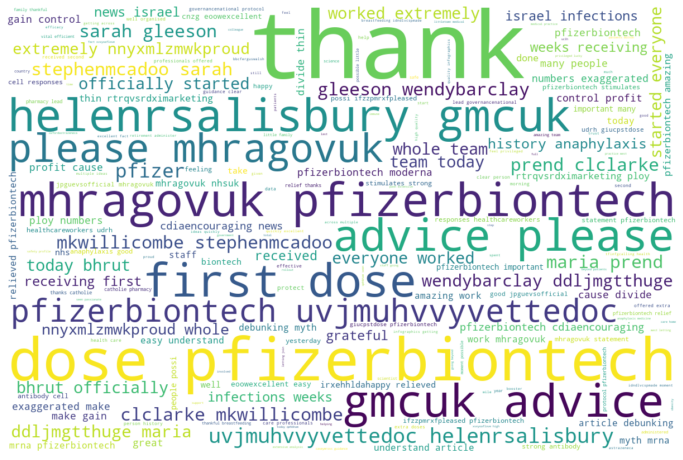


Neutral topics
Topic 1: dose today second pfizer weeks people biontech 
Topic 2: today getting szrrmp chose italy oxfordastrazeneca aejgsmba 
Topic 3: pfizer today biontech doses getting relevant group 
Topic 4: moderna oxfordastrazeneca anegpg mixed astrazeneca different yteqlzrvzdifferent 
Topic 5: hours americans announces rollout trump fzqsmnhoy szjnqi 


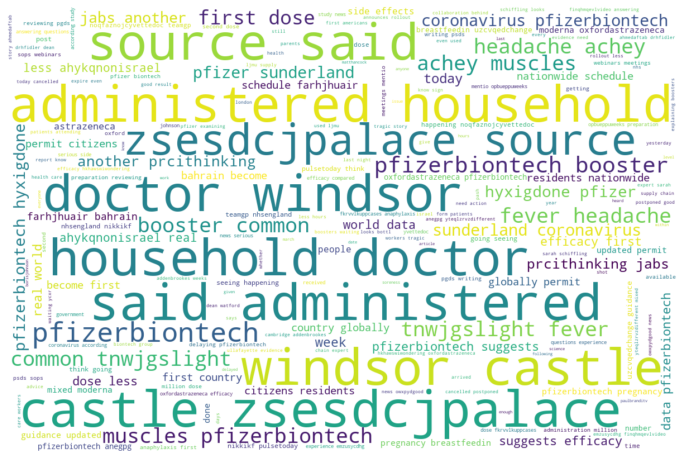


Negative topics
Topic 1: delay pfizerbiontech people second claim given large 
Topic 2: second claim given large numbers stunt delay 
Topic 3: pfizer really worried daozmdtzvh grandparents implications yesterday 
Topic 4: dose risk ezzh greatly hospitalised received reduces 
Topic 5: worry need chicken freezer nnyeixfn nuggets death 


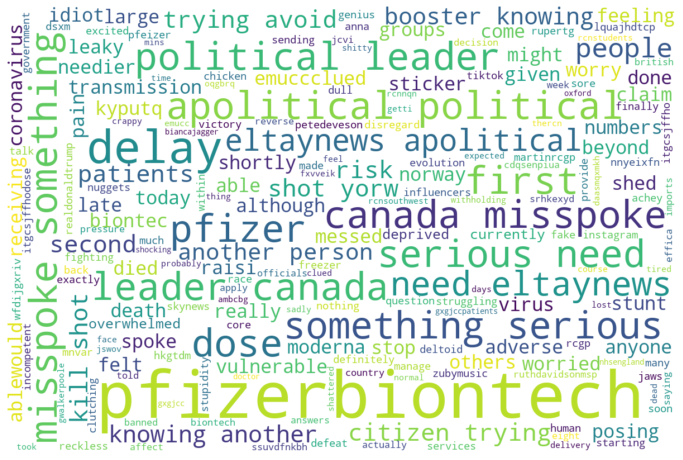

In [31]:
print('Positive topics')
getTopics(df_tweets.query("user_country == 'GB' & compound_sentiment>0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'GB' & compound_sentiment>0.25"))
print('\nNeutral topics')
getTopics(df_tweets.query("user_country == 'GB' & compound_sentiment<0.25 & compound_sentiment>-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'GB' & compound_sentiment<0.25 & compound_sentiment>-0.25"))
print('\nNegative topics')
getTopics(df_tweets.query("user_country == 'GB' & compound_sentiment<-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'GB' & compound_sentiment<-0.25"))

### Canada topic analysis and word cloud visualization.

Positive topics
Topic 1: dose pfizer grhospitalkw happy today gotten feeling 
Topic 2: pfizer good changed protocol trying safe trwl 
Topic 3: canada approved moderna astrazeneca know need sure 
Topic 4: betthehouse calculated erinotoole party took toole politicsbeforecountry 
Topic 5: today love hospital englishmanadam jcardin pointers think 


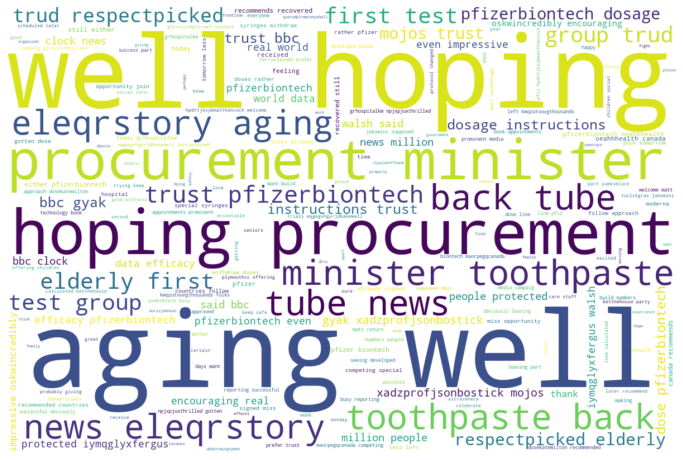


Neutral topics
Topic 1: pfizer biontech airline cargo delivers flight singapore 
Topic 2: dose days weeks work later second yesterday 
Topic 3: oxfordastrazeneca mojos supply brendasimmonds mrsaitchbee blue issue 
Topic 4: canada pfizer dose world line second cdnpoli 
Topic 5: second today dose feeling beginning bjxmsos grateful 


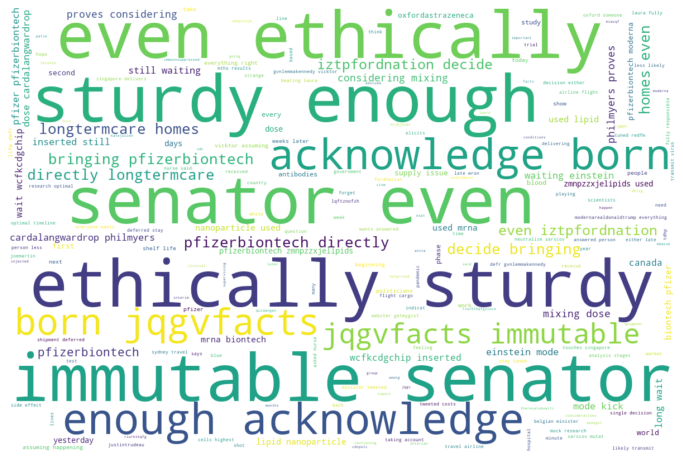


Negative topics
Topic 1: rare reaction severe suffered suffers seiz years 
Topic 2: pfizerbiontech days felt little prick dose offered 
Topic 3: pfizer relative risk envy administer avert case 
Topic 4: days arrived away isolation izvrlexpc passed residents 
Topic 5: envy pfizer feeling moderna authorities biontech died 


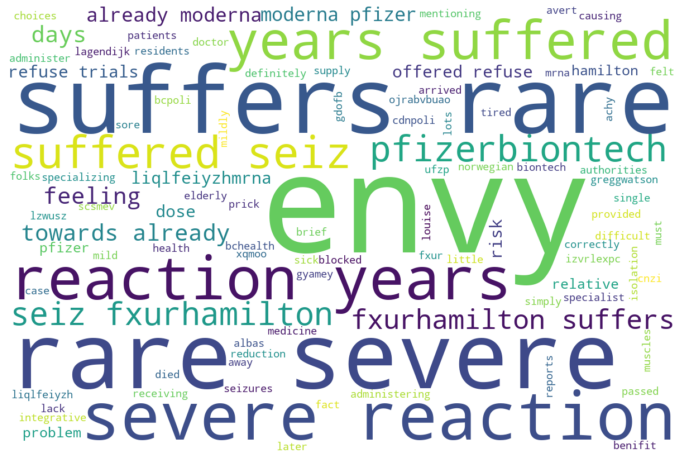

In [32]:
print('Positive topics')
getTopics(df_tweets.query("user_country == 'CA' & compound_sentiment>0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'CA' & compound_sentiment>0.25"))
print('\nNeutral topics')
getTopics(df_tweets.query("user_country == 'CA' & compound_sentiment<0.25 & compound_sentiment>-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'CA' & compound_sentiment<0.25 & compound_sentiment>-0.25"))
print('\nNegative topics')
getTopics(df_tweets.query("user_country == 'CA' & compound_sentiment<-0.25"), topicsNum=5)
showWordCloud(df_tweets.query("user_country == 'CA' & compound_sentiment<-0.25"))

### Topic Analysis

By putting these topics into google and searching them, we can bring up articles most closely relating to the string of words of each topic model. From there, we can understand the attitude people have towards the vaccine, and what social issues people are concerned about.

On a Global Scale, everyone who falls in the positive bracket is thankful for receiving the vaccine. As we shift into neutral territory, the demographic becomes people reporting news about their experience with the vaccine, or news regarding the distribution and pricing of the vaccine. In the negative territory, we can see that a majority of the concerns are people dying due to the COVID vaccine. Searching up topic #2 "pfizer biontech emergency norway korea died people", reveals that these concerns may be focused on the fact that the Pfizer-BioNTech vaccine game to Norway and raised death toll and lowers age range of people thought to be affected. More here

Within the US, the positive sentiment score bracket consists of people who took the vaccine sharing their gratitude towards testing facilities and scientists who developed the vaccine. In the neutral camp, we mainly have people who reported their second vaccination. However, one topic "moderna received doses astrazeneca people million johnson" reveals that Americans are also tweeting about the AstraZeneca vaccine and Moderna. This is regarding the Comapny Moderna's decision to recently start testing the Pfizer and BioNTech vaccines on Children. This study itself appears to be rather safe, but the real concern is that AstraZeneca, which was deemed dangerous and banned by multiple countries, has begun tests with Children in the UK. It is likely that these concerns may grow louder if AstraZeneca were to be approved in the US. Finally, in the negative category we have people reporting the negative side affects of the vaccine. We assume that as the vaccine gets distributed to more people, these sorts of tweets will increase.
Within the UK, positive tweets are similar to the US, thanking the Vaccine, the scientists behind its development. Some people are also tweeting about new medicine such as dexamethasone, which is suggested to cut the death rate of patients on ventilators by 1/3. As we move into neutral sentiment scores, the talk of AstraZeneca once again comes up. For UK residents, much of the talk regarding this involves AstraZeneca being used in conjunction with another vaccine for the first and second doses. The UK is currently trying to use a mixed vaccine plan called the Oxford-AstraZeneca, as it may serve as a cheaper alternative to the Pfizer and BioNTech vaccines. Recent studies, however, address the safety concerns of this vaccine and that it's only 70% effective. Neutral tweets are likely tweeting about latest news regarding its safety and the UK's decision to use it. Negative sentiment scores are all related to how Pfizer and BioNTech vaccines have been delayed, and how some elder family members may not be able to get them in time.

Within India, positive sentiment scores are correlated with news about how effective the Pfizer-BioNTech and Oxford-AstraZeneca vaccines are becoming. This is a bit surprising, as AstraZeneca seems to be a controversial topic in the US and the UK. We deduce, however, that because India is having trouble rolling out the vaccine, people may be hopeful towards the prospect of any vaccine. Neutral Sentiment Scores are talking about potential growth in vaccines involving Pfizer-BioNTech, Oxford-AstraZeneca, and Moderna. Articles about Pfizer-BioNTech working against African variants of the COVID 19 virus, AstraZeneca buying comapny Alexion for $39 billion to increase research prospects, and infographics comparing the current vaccines have all been talked about a lot. This is in conjunction to some news regarding Pfizer-BioNTech increasing the death toll in Norway. The negative sentiment scores span a wide range, talking about the risks people with allergies have when taking the Pfizer vaccine, and India's decision to further monitor the vaccine after reported cases of death in Norway. It seems that in India's case, a lack of rollout has led to convolution of information and general frustration.


**Don't forget to save our hard work!**

In [33]:
df_tweets.to_csv('works_so_far.csv')

## Spatial Analysis! I mean....Maps!!!
To get a clear visual idea of how custered our data is, and how different the average sentiment scores are, we need to make maps!!

### But not yet...
We need some further data engineering to make the map.
Starting by subsetting the data we want to map.

In [34]:
import pandas as pd
df_tweets = pd.read_csv('works_so_far.csv')
df_tweets = df_tweets.drop(columns=df_tweets.columns[0])
df_map = df_tweets[df_tweets.user_city.notnull()]
df_map.shape

(2342, 28)

There is just too much data to use in an interactive map. We want to reduce the amount of data points by grouping the the data points by the cities and calculatet their average compound sentiment score.

In [35]:
df_map1 = df_map.groupby(['user_city','lat','lon']).mean()
df_map1 = df_map1.reset_index()
print(df_map1.shape)
df_map1.head()

(564, 15)


,user_city,lat,lon,id,user_followers,user_friends,user_favourites,user_verified,retweets,favorites,is_retweet,neg_sentiment,pos_sentiment,neu_sentiment,compound_sentiment
0,Abu Dhabi,24.453835,54.377401,1.345915e+18,591986.285714,379.142857,2551.0,0.571429,1.428571,7.285714,0.0,0.000,0.135571,0.864429,0.202314
1,Abuja,9.064331,7.489297,1.357701e+18,369.000000,83.500000,318.0,0.000000,24.500000,24.500000,0.0,0.000,0.000000,1.000000,0.000000
2,Accra,5.560014,-0.205744,1.357240e+18,2350.000000,43.000000,443.0,0.000000,0.000000,0.000000,0.0,0.000,0.000000,1.000000,0.000000
3,Addis Ababa,9.010793,38.761252,1.351065e+18,1196.000000,114.000000,541.0,0.000000,0.000000,0.000000,0.0,0.265,0.000000,0.735000,-0.557400
4,Adelaide,-34.928181,138.599931,1.358111e+18,173.000000,1050.500000,12254.5,0.000000,0.000000,0.500000,0.0,0.139,0.000000,0.861000,-0.200950


Now we are down to 559 data points! We may also want to visualize the amount of tweets from each city. 

In [36]:
df_map2 = df_map['user_city'].value_counts(sort=True).to_frame().reset_index()
df_map2.columns = ['user_city', 'counts']
print(df_map2.shape)
df_map2.head()

(564, 2)


,user_city,counts
0,London,205
1,Dubai,76
2,Toronto,57
3,Delhi,54
4,New York,50


Now we merge two data frames by city name.

In [37]:
df_map = pd.merge(df_map1, df_map2, on="user_city")
print(df_map.shape)
df_map.head()

(564, 16)


,user_city,lat,lon,id,user_followers,user_friends,user_favourites,user_verified,retweets,favorites,is_retweet,neg_sentiment,pos_sentiment,neu_sentiment,compound_sentiment,counts
0,Abu Dhabi,24.453835,54.377401,1.345915e+18,591986.285714,379.142857,2551.0,0.571429,1.428571,7.285714,0.0,0.000,0.135571,0.864429,0.202314,7
1,Abuja,9.064331,7.489297,1.357701e+18,369.000000,83.500000,318.0,0.000000,24.500000,24.500000,0.0,0.000,0.000000,1.000000,0.000000,2
2,Accra,5.560014,-0.205744,1.357240e+18,2350.000000,43.000000,443.0,0.000000,0.000000,0.000000,0.0,0.000,0.000000,1.000000,0.000000,1
3,Addis Ababa,9.010793,38.761252,1.351065e+18,1196.000000,114.000000,541.0,0.000000,0.000000,0.000000,0.0,0.265,0.000000,0.735000,-0.557400,1
4,Adelaide,-34.928181,138.599931,1.358111e+18,173.000000,1050.500000,12254.5,0.000000,0.000000,0.500000,0.0,0.139,0.000000,0.861000,-0.200950,2


Do some further cleaning just in case.

In [38]:
import numpy as np
df_map.replace('', np.nan, inplace=True)
df_map.shape
# save the file
df_map.to_csv('tweets_map.csv')

### Static point map
First lets make a static map to see if there are any specific parts of the world to focus on.

In [39]:
import geopandas as gpd
import pandas as pd
%matplotlib inline
df_map=pd.read_csv('tweets_map.csv')

In [40]:
from shapely.geometry import Point, Polygon
crs = {'init': 'epsg:4326'}

geometry = [Point(xy) for xy in zip(df_map["lon"], df_map["lat"])].copy()
geo_df = gpd.GeoDataFrame(df_map,
                         crs = crs,
                          geometry = geometry).copy()
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

C:\Users\Wuyue\anaconda3\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


Create geodataframe out of lat long coordinates

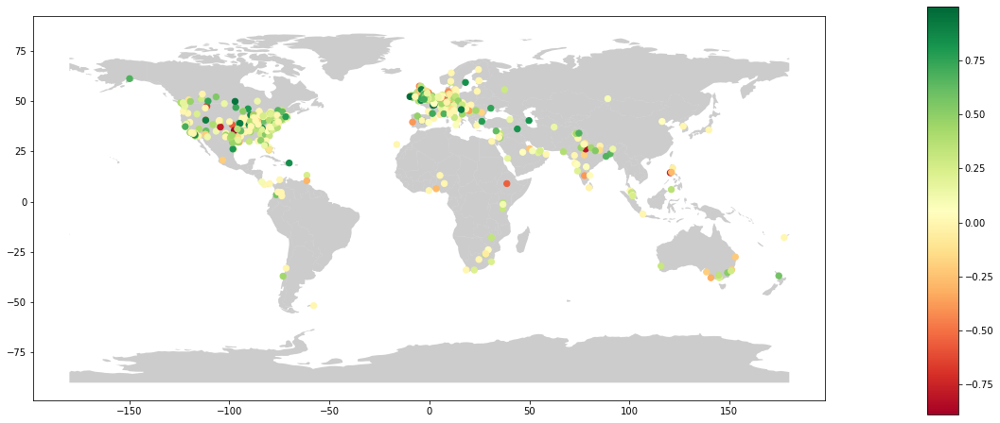

In [41]:
import matplotlib.pyplot as plt
fig,ax = plt.subplots(figsize = (15,15))

world.plot(ax = ax, alpha = 0.4, color = "grey")
geo_df.plot(ax = ax, column = 'compound_sentiment', cmap = 'RdYlGn', markersize = 40, marker = "o")

fig = ax.get_figure()
cax = fig.add_axes([1, 0.3, 0.03, 0.4])
dfmax = geo_df["compound_sentiment"].max()
dfmin = geo_df["compound_sentiment"].min()
sm = plt.cm.ScalarMappable(cmap='RdYlGn', norm=plt.Normalize(vmin=dfmin, vmax=dfmax))
sm._A = []
fig.colorbar(sm, cax=cax)

We can see that datapoints are focused around the US, Inda, and Europe. Since there are three big hotspots, lets make an interactive map. Now the plot size varies with the tweet counts of that city and the color of the plot varies with the sentiment score.

### Interactive Map!

In [42]:
import math
import numpy as np
import plotly.express as px
token='pk.eyJ1IjoiamFja3VjbGEiLCJhIjoiY2tpN25zY3U2MXZuaTJ6bGxjazRhNzBybiJ9.VwOT4w_2ZMcqVot6_cawtg'
df_map['counts'] = df_map['counts'].astype('int32')
df_map['sizes'] = np.log2(df_map['counts'])*3+1

fig = px.scatter_mapbox(df_map,
                        hover_name = 'user_city',
                        lon = 'lon',
                        lat = 'lat',
                        size = 'sizes',
                        color = 'compound_sentiment',
                        color_continuous_scale = px.colors.carto.Temps_r
                       )
fig.update_layout(mapbox = {'accesstoken': token, 'center': {'lon': 15, 'lat': 20}, 'zoom': 1},
                  margin = {'l': 1, 'r': 0, 't': 0, 'b': 0})
fig.write_html("tweets.html")
fig.show()

### A comparison with the COVID-19 Case map!

In [43]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

import os
import math

In [44]:
def add_commas(num):
    out = ""
    counter = 0
    for n in num[::-1]:
        counter += 1
        if counter == 4:
            counter = 1
            out = "," + out
        out = n + out
    return out


df_summary = pd.read_csv('worldometer_coronavirus_summary_data.csv')
df_summary['log(Total Confirmed)'] = np.log2(df_summary['total_confirmed'])
df_summary['Total Confirmed'] = df_summary['total_confirmed'].apply(lambda x: add_commas(str(x)))

fig = px.choropleth(df_summary,
                    locations="country",
                    color="log(Total Confirmed)",
                    locationmode = 'country names',
                    hover_name='country',
                    hover_data=['Total Confirmed'],
                    color_continuous_scale='reds',
                    title = '<b>Coronavirus Confirmed Cases Around The Globe</b>')


log_scale_vals = list(range(0,25,2))
scale_vals = (np.exp2(log_scale_vals)).astype(int).astype(str)

scale_vals = list(map(add_commas, scale_vals))

fig.update_layout(title_font_size=22,
                  margin={"r":20, "l":30},
                  coloraxis={#"showscale":False,
                            "colorbar":dict(title="<b>Confirmed Cases</b><br>",
                                            #range=[np.log(50), np.log(6400)],
                                            titleside="top",
                                            tickmode="array",
                                            tickvals=log_scale_vals,
                                            ticktext=scale_vals
                                        )},
                 )
fig.write_html("cholopeth.html")
fig.
fig.show()

If we layer this over the map of tweets, we can see that our plot points seem to line up with the hardest hit countries.

We can see that India cities Mumbai and New Dehli have a particularly larger number of low sentiment scores. This leads us to believe that there may be some socio-political reason that is influencing public opinion about the COVID vaccine.

### Conclusion
Our group spent a lot of time trying to tailor the topics modeling algorithm to a point where it was usable. The results served to be informative, providing us with very up to date information on the topics concerning people across the world. It is interesting to see how the the decisions of the UK to allow Oxford-AstraZeneca has influenced the US and India in two different ways (one in worry, and one in anticipation). The changes in responses have to do with the way the government has responded to vaccine distribution, and it will be interesting to see how the topics in positive, natural, and negative sentiment scores will change as vaccine rollout status, and vaccine development changes.